In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from tqdm.notebook import tqdm

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [5]:
# check if cuda is available
if torch.cuda.is_available():
    device = "cuda"
    torch.cuda.empty_cache()
else:
    device = "cpu"

In [ ]:
#import kagglehub
#path = kagglehub.dataset_download("lakshmi25npathi/imdb-dataset-of-50k-movie-reviews")
#path

In [ ]:
# torchdata deprecated.  Use keras to load dataset

In [6]:
import os

os.environ["KERAS_BACKEND"] = "torch"  # @param ["tensorflow", "jax", "torch"]

import keras

In [7]:
(x_train, y_train), (x_test, y_test) = keras.datasets.imdb.load_data()

17464789/17464789 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [8]:
print(type(x_train[0]))
print(x_train[0])

<class 'list'>
[1, 14, 22, 16, 43, 530, 973, 1622, 1385, 65, 458, 4468, 66, 3941, 4, 173, 36, 256, 5, 25, 100, 43, 838, 112, 50, 670, 22665, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 21631, 336, 385, 39, 4, 172, 4536, 1111, 17, 546, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2025, 19, 14, 22, 4, 1920, 4613, 469, 4, 22, 71, 87, 12, 16, 43, 530, 38, 76, 15, 13, 1247, 4, 22, 17, 515, 17, 12, 16, 626, 18, 19193, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2223, 5244, 16, 480, 66, 3785, 33, 4, 130, 12, 16, 38, 619, 5, 25, 124, 51, 36, 135, 48, 25, 1415, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 10311, 8, 4, 107, 117, 5952, 15, 256, 4, 31050, 7, 3766, 5, 723, 36, 71, 43, 530, 476, 26, 400, 317, 46, 7, 4, 12118, 1029, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2071, 56, 26, 141, 6, 194, 7486, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 5535, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 1334, 88, 12, 16, 283, 5, 16, 4472, 113, 103, 32, 15, 16, 5345, 19, 178, 32]


In [9]:
wi = keras.datasets.imdb.get_word_index()
print(wi["movie"])
iw = {n+3:w for w,n in wi.items()}
iw[0] = "<PAD>"
iw[1] = "<START>"
iw[2] = "<OOV>"  # out of vocabulary
print(iw)

1641221/1641221 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
17
{34704: 'fawn', 52009: 'tsukino', 52010: 'nunnery', 16819: 'sonja', 63954: 'vani', 1411: 'woods', 16118: 'spiders', 2348: 'hanging', 2292: 'woody', 52011: 'trawling', 52012: "hold's", 11310: 'comically', 40833: 'localized', 30571: 'disobeying', 52013: "'royale", 40834: "harpo's", 52014: 'canet', 19316: 'aileen', 52015: 'acurately', 52016: "diplomat's", 25245: 'rickman', 6749: 'arranged', 52017: 'rumbustious', 52018: 'familiarness', 52019: "spider'", 68807: 'hahahah', 52020: "wood'", 40836: 'transvestism', 34705: "hangin'", 2341: 'bringing', 40837: 'seamier', 34706: 'wooded', 52021: 'bravora', 16820: 'grueling', 1639: 'wooden', 16821: 'wednesday', 52022: "'prix", 34707: 'altagracia', 52023: 'circuitry', 11588: 'crotch', 57769: 'busybody', 52024: "tart'n'tangy", 14132: 'burgade', 52026: 'thrace', 11041: "tom's", 52028: 'snuggles', 29117: 'francesco', 52030: 'complainers', 52128: 'templarios', 40838: '272', 52031: '273', 52133: 'zaniacs'

In [10]:
print(list(iw[i] for i in x_train[0]))

['<START>', 'this', 'film', 'was', 'just', 'brilliant', 'casting', 'location', 'scenery', 'story', 'direction', "everyone's", 'really', 'suited', 'the', 'part', 'they', 'played', 'and', 'you', 'could', 'just', 'imagine', 'being', 'there', 'robert', "redford's", 'is', 'an', 'amazing', 'actor', 'and', 'now', 'the', 'same', 'being', 'director', "norman's", 'father', 'came', 'from', 'the', 'same', 'scottish', 'island', 'as', 'myself', 'so', 'i', 'loved', 'the', 'fact', 'there', 'was', 'a', 'real', 'connection', 'with', 'this', 'film', 'the', 'witty', 'remarks', 'throughout', 'the', 'film', 'were', 'great', 'it', 'was', 'just', 'brilliant', 'so', 'much', 'that', 'i', 'bought', 'the', 'film', 'as', 'soon', 'as', 'it', 'was', 'released', 'for', 'retail', 'and', 'would', 'recommend', 'it', 'to', 'everyone', 'to', 'watch', 'and', 'the', 'fly', 'fishing', 'was', 'amazing', 'really', 'cried', 'at', 'the', 'end', 'it', 'was', 'so', 'sad', 'and', 'you', 'know', 'what', 'they', 'say', 'if', 'you', '

In [11]:
print(list(x[0] for x in x_train))

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [12]:
# sentiment: positive/negative
print(y_train)

[1 0 0 ... 0 1 0]


In [14]:
sum(y_train) / len(y_train)

np.float64(0.5)

In [15]:
print("How many different words?")
print(max(max(x) for x in x_train))

How many different words?
88586


In [16]:
print("Longest review?")
print(max(len(x) for x in x_train))
print("Shortest review?")
print(min(len(x) for x in x_train))
print("Average length?")
print(sum(len(x) for x in x_train) / len(x_train))

Longest review?
2494
Shortest review?
11
Average length?
238.71364


# Preparation: padding

In [ ]:
# each record has different length.  Not all methods like that....

In [ ]:
max_features = 120000  # maximum word number
maxlen = 250  # cut texts after this number of words (among top max_features most common words)
#maxlen = 50  # FOR SPEED

In [ ]:
# pad sequences at end
# by default with 0's
x_train_p = keras.preprocessing.sequence.pad_sequences(x_train, maxlen=maxlen, padding='post', truncating="post")
x_test_p = keras.preprocessing.sequence.pad_sequences(x_test, maxlen=maxlen, padding='post', truncating="post")
print('x_train shape:', x_train_p.shape)
print('x_test shape:', x_test_p.shape)
print(type(x_train_p))
x_train_p

x_train shape: (25000, 250)
x_test shape: (25000, 250)
<class 'numpy.ndarray'>


array([[   1,   14,   22, ...,    0,    0,    0],
       [   1,  194, 1153, ...,    0,    0,    0],
       [   1,   14,   47, ...,    0,    0,    0],
       ...,
       [   1,   11,    6, ...,    0,    0,    0],
       [   1, 1446, 7079, ...,    0,    0,    0],
       [   1,   17,    6, ...,    0,    0,    0]], dtype=int32)

In [ ]:
print(list(iw[i] for i in x_train_p[0]))
print(list(iw[i] for i in x_train_p[5]))

['<START>', 'this', 'film', 'was', 'just', 'brilliant', 'casting', 'location', 'scenery', 'story', 'direction', "everyone's", 'really', 'suited', 'the', 'part', 'they', 'played', 'and', 'you', 'could', 'just', 'imagine', 'being', 'there', 'robert', "redford's", 'is', 'an', 'amazing', 'actor', 'and', 'now', 'the', 'same', 'being', 'director', "norman's", 'father', 'came', 'from', 'the', 'same', 'scottish', 'island', 'as', 'myself', 'so', 'i', 'loved', 'the', 'fact', 'there', 'was', 'a', 'real', 'connection', 'with', 'this', 'film', 'the', 'witty', 'remarks', 'throughout', 'the', 'film', 'were', 'great', 'it', 'was', 'just', 'brilliant', 'so', 'much', 'that', 'i', 'bought', 'the', 'film', 'as', 'soon', 'as', 'it', 'was', 'released', 'for', 'retail', 'and', 'would', 'recommend', 'it', 'to', 'everyone', 'to', 'watch', 'and', 'the', 'fly', 'fishing', 'was', 'amazing', 'really', 'cried', 'at', 'the', 'end', 'it', 'was', 'so', 'sad', 'and', 'you', 'know', 'what', 'they', 'say', 'if', 'you', '

# Embedding layer

In [ ]:
e = nn.Embedding(max_features, 10)
doc = torch.tensor([0,5,0])  # three words: 0, 5 and 0
emb = e(doc)
print(emb.shape) # 3 words, 10 dimensions
emb

torch.Size([3, 10])


tensor([[ 0.6952, -0.7117,  0.0092,  1.5632,  1.4610, -0.6019,  1.7423,  0.6431,
         -0.6993,  0.3878],
        [-0.3913,  0.1622, -1.0887,  0.9034, -0.5528,  0.0483,  1.3425,  0.2339,
         -0.4771, -0.5841],
        [ 0.6952, -0.7117,  0.0092,  1.5632,  1.4610, -0.6019,  1.7423,  0.6431,
         -0.6993,  0.3878]], grad_fn=<EmbeddingBackward0>)

In [ ]:
list(name for name, _ in e.named_parameters())

['weight']

In [ ]:
print(e.weight.shape)

torch.Size([120000, 10])


In [ ]:
print(e.weight[0])
print(e.weight[5])

tensor([ 0.6952, -0.7117,  0.0092,  1.5632,  1.4610, -0.6019,  1.7423,  0.6431,
        -0.6993,  0.3878], grad_fn=<SelectBackward0>)
tensor([-0.3913,  0.1622, -1.0887,  0.9034, -0.5528,  0.0483,  1.3425,  0.2339,
        -0.4771, -0.5841], grad_fn=<SelectBackward0>)


In [ ]:
# forward pass is just lookup
print("layer call:\n")
print(emb)
print("\ncorresponding weights:\n")
print(e.weight[[0,5,0]])

layer call:

tensor([[ 0.6952, -0.7117,  0.0092,  1.5632,  1.4610, -0.6019,  1.7423,  0.6431,
         -0.6993,  0.3878],
        [-0.3913,  0.1622, -1.0887,  0.9034, -0.5528,  0.0483,  1.3425,  0.2339,
         -0.4771, -0.5841],
        [ 0.6952, -0.7117,  0.0092,  1.5632,  1.4610, -0.6019,  1.7423,  0.6431,
         -0.6993,  0.3878]], grad_fn=<EmbeddingBackward0>)

corresponding weights:

tensor([[ 0.6952, -0.7117,  0.0092,  1.5632,  1.4610, -0.6019,  1.7423,  0.6431,
         -0.6993,  0.3878],
        [-0.3913,  0.1622, -1.0887,  0.9034, -0.5528,  0.0483,  1.3425,  0.2339,
         -0.4771, -0.5841],
        [ 0.6952, -0.7117,  0.0092,  1.5632,  1.4610, -0.6019,  1.7423,  0.6431,
         -0.6993,  0.3878]], grad_fn=<IndexBackward0>)


In [ ]:
e(torch.tensor(x_train_p)).shape

torch.Size([25000, 250, 10])

# Torch training data



In [ ]:
from torch.utils.data import DataLoader, TensorDataset

In [ ]:
d_train = TensorDataset(torch.tensor(x_train_p), torch.tensor(y_train))
d_test = TensorDataset(torch.tensor(x_test_p), torch.tensor(y_test))
dl_train = DataLoader(d_train, batch_size=128, shuffle=True)
dl_test = DataLoader(d_test, batch_size=128, shuffle=False)

In [ ]:
# function to evaluate accuracy
def eval_net(net, d):
    net = net.to(device)
    net.eval()
    with torch.no_grad():
        acc_sum = 0
        n = 0
        for x, y in tqdm(d):
            pred = net(x.to(device))
            predicted = (1*(pred > 0)).cpu()
            acc_sum += (predicted==y.unsqueeze(1)).sum().item()
            n += x.shape[0]
    return acc_sum/n

In [ ]:
# training loop
import torch.optim as optim

def fit(net, train=dl_train, valid=dl_test, epochs=10,
        learning_rate=None):
    net = net.to(device)

    if learning_rate is None:
        optimizer = optim.Adam(net.parameters())
    else:
        optimizer = optim.Adam(net.parameters(), lr=learning_rate)
    loss = torch.nn.BCEWithLogitsLoss()
    for e in range(epochs):
        net.train()
        for X, y in tqdm(train):
            optimizer.zero_grad()
            X = X.to(device)
            y = y.to(device)
            pred = net(X)
            l = loss(pred, (y).unsqueeze(1).float())
            l.backward()
            optimizer.step()
        if valid is not None:
            print("Accuracy at epoch", e, ":", eval_net(net, valid))

In [ ]:
# bag-of-words logistic regression
m = nn.Sequential(
    nn.Embedding(max_features, 1),
    nn.Flatten(),
    nn.Linear(1*maxlen, 1),
)

In [ ]:
eval_net(m, dl_test)

  0%|          | 0/196 [00:00<?, ?it/s]

0.50228

In [ ]:
fit(m, epochs=50)

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.50484


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.5094


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.5058


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.50924


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.50816


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.50944


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.51076


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.51164


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.51424


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.5194


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 10 : 0.52752


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 11 : 0.54564


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 12 : 0.5768


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 13 : 0.62076


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 14 : 0.66192


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 15 : 0.69472


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 16 : 0.71796


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 17 : 0.73556


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 18 : 0.75188


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 19 : 0.76212


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 20 : 0.77156


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 21 : 0.77992


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 22 : 0.78532


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 23 : 0.79176


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 24 : 0.7966


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 25 : 0.79968


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 26 : 0.80336


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 27 : 0.80588


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 28 : 0.80964


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 29 : 0.81276


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 30 : 0.81396


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 31 : 0.81732


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 32 : 0.81852


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 33 : 0.82024


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 34 : 0.82104


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 35 : 0.82296


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 36 : 0.82356


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 37 : 0.825


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 38 : 0.82556


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 39 : 0.82656


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 40 : 0.82656


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 41 : 0.82776


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 42 : 0.82876


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 43 : 0.82904


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 44 : 0.82868


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 45 : 0.82884


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 46 : 0.83


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 47 : 0.82904


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 48 : 0.8302


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 49 : 0.82976


In [ ]:
# by default Pytorch expects: length x batch x emb_dim
# can use batch_first=True in layers to change this
class RNN_net(nn.Module):
  def __init__(self):
    super().__init__()
    self.e = nn.Embedding(max_features, 128)
    self.rnn = nn.RNN(128, 64, nonlinearity='relu', batch_first=True)
    self.fl = nn.Flatten()
    self.l1 = nn.Linear(64, 1)
    self.print_shapes = True
  def forward(self, x):
    emb = self.e(x)
    r = self.rnn(emb)
    # rnn returns full_output_sequence, final_symbol's output
    if self.print_shapes:
      print(r[0].shape)
      print(r[1].shape)
      self.print_shapes = False
    x = self.fl(r[1][0])  # hidden state of last layer, first direction
    x = self.l1(x)
    return x
m_rnn = RNN_net()

In [ ]:
fit(m_rnn)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 64])
torch.Size([1, 128, 64])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.50276


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.50544


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.50232


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.50476


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.50464


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.50376


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.50344


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.50272


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.50144


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.50116


In [ ]:
class LSTM_net(nn.Module):
  def __init__(self):
    super().__init__()
    self.e = nn.Embedding(max_features, 128)
    self.lstm = nn.LSTM(128, 64, batch_first=True)
    self.fl = nn.Flatten()
    self.l1 = nn.Linear(64, 1)
    self.print_shapes = True
  def forward(self, x):
    emb = self.e(x)
    r = self.lstm(emb)
    # lstm returns full_output_sequence, (final_hidden_state, final_cell_state=memory)
    if self.print_shapes:
      print(r[0].shape)
      print(r[1][0].shape)
      print(r[1][1].shape)
      self.print_shapes = False
    x = self.fl(r[1][0][0])  # hidden state of last layer, first direction
    x = self.l1(x)
    return x
m_lstm = LSTM_net()

In [ ]:
fit(m_lstm)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 64])
torch.Size([1, 128, 64])
torch.Size([1, 128, 64])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.50604


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.54192


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.6692


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.73116


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.78328


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.81176


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.80852


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.77252


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.81744


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.80776


In [ ]:
class GRU_net(nn.Module):
  def __init__(self):
    super().__init__()
    self.e = nn.Embedding(max_features, 128)
    self.gru = nn.GRU(128, 64, batch_first=True)
    self.fl = nn.Flatten()
    self.l1 = nn.Linear(64, 1)
    self.print_shapes = True
  def forward(self, x):
    emb = self.e(x)
    r = self.gru(emb)
    # gru returns full_output_sequence, final_hidden_state
    if self.print_shapes:
      print(r[0].shape)
      print(r[1].shape)
      self.print_shapes = False
    x = self.fl(r[1][0])  # hidden state of last layer, first direction
    x = self.l1(x)
    return x
m_gru = GRU_net()

In [ ]:
fit(m_gru)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 64])
torch.Size([1, 128, 64])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.50472


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.68092


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.71588


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.76508


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.79456


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.8184


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.82468


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.804


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.8362


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.8316


# Stacking multiple recurrent layers

In [ ]:
# can use deroput parameter

In [ ]:
class GRU_2l_net(nn.Module):
  def __init__(self):
    super().__init__()
    self.e = nn.Embedding(max_features, 128)
    self.rnn = nn.GRU(128, 64,
                      num_layers=2,  # <- 2 layers
                      dropout=0.2,
                      batch_first=True)
    self.fl = nn.Flatten()
    self.l1 = nn.Linear(64, 1)
    self.print_shapes = True
  def forward(self, x):
    emb = self.e(x)
    r = self.rnn(emb)
    # gru returns full_output_sequence, final_hidden_state
    if self.print_shapes:
      print(r[0].shape)
      print(r[1].shape)
      self.print_shapes = False
    x = self.fl(r[1][1])  # hidden state of last layer
    x = self.l1(x)
    return x
m_gru2 = GRU_2l_net()

In [ ]:
fit(m_gru2)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 64])
torch.Size([2, 128, 64])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.57284


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.76


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.7986


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.82768


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.8354


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.84324


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.83972


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.83908


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.83976


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.83596


# Bidirectional layers

In [ ]:
class GRU_bi_net(nn.Module):
  def __init__(self):
    super().__init__()
    self.e = nn.Embedding(max_features, 128)
    self.rnn = nn.GRU(128, 64, batch_first=True,
                      bidirectional=True,
                      )
    self.fl = nn.Flatten()
    self.l1 = nn.Linear(128, 1)   # 64 * 2 directions
    self.print_shapes = True
  def forward(self, x):
    emb = self.e(x)
    r = self.rnn(emb)
    # gru returns full_output_sequence, final_hidden_state
    if self.print_shapes:
      print(r[0].shape)
      print(r[1].shape)
      self.print_shapes = False
    x = self.fl(torch.permute(r[1], (1,0,2)))  # hidden state of last layer, both directions
    x = self.l1(x)
    return x
m_gru_bi = GRU_bi_net()

In [ ]:
fit(m_gru_bi)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 128])
torch.Size([2, 128, 64])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.70372


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.7062


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.68544


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.79016


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.80688


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.82332


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.82876


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.82268


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.81104


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.8266


In [ ]:
# two bidirectional layers

In [ ]:
class GRU_bi_2l_net(nn.Module):
  def __init__(self):
    super().__init__()
    self.e = nn.Embedding(max_features, 128)
    self.rnn = nn.GRU(128, 64, batch_first=True,
                      num_layers=2,
                      dropout=0.2,
                      bidirectional=True,
                      )
    self.fl = nn.Flatten()
    self.l1 = nn.Linear(128, 1)   # 64 * 2 directions
    self.print_shapes = True
  def forward(self, x):
    emb = self.e(x)
    r = self.rnn(emb)
    # gru returns full_output_sequence, final_hidden_state
    if self.print_shapes:
      print(r[0].shape)
      print(r[1].shape)
      self.print_shapes = False
    x = self.fl(torch.permute(r[1][torch.tensor([1,3])], (1,0,2)))  # hidden state of last layer, both directions
    x = self.l1(x)
    return x
m_gru_bi2 = GRU_bi_2l_net()

In [ ]:
fit(m_gru_bi2)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 128])
torch.Size([4, 128, 64])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.65296


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.74284


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.80324


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.8358


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.84876


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.8514


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.85008


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.84416


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.83684


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.8438


# Convolutional layers for text

In [ ]:
class Conv_net1(nn.Module):
  def __init__(self, nc=5):
    super().__init__()
    self.e = nn.Embedding(max_features, 128)
    self.c1 = nn.Conv1d(128, 32, nc)
    self.fl = nn.Flatten()
    self.l1 = nn.Linear((maxlen-nc+1)*32, 1)
    self.print_shapes = True
  def forward(self, x):
    emb = self.e(x)
    if self.print_shapes:
      print(emb.shape)
    emb = torch.permute(emb, (0,2,1)) # put token dimension last
    c = self.c1(emb)
    c = F.relu(c)
    if self.print_shapes:
      print(emb.shape)
      print(c.shape)
      self.print_shapes = False
    x = self.fl(c)
    x = self.l1(x)
    return x

In [ ]:
m_conv1 = Conv_net1()
fit(m_conv1, epochs=10)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 128])
torch.Size([128, 128, 250])
torch.Size([128, 32, 246])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.77352


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.82344


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.83


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.81652


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.83612


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.83692


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.8368


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.83732


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.83792


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.8372


In [ ]:
m_conv2 = Conv_net1(7)
fit(m_conv2, epochs=10)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 128])
torch.Size([128, 128, 250])
torch.Size([128, 32, 244])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.78496


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.78528


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.82604


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.82724


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.83108


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.8304


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.83372


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.83504


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.83564


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.83572


In [ ]:
class Conv_net2(nn.Module):
  def __init__(self, nc=5):
    super().__init__()
    self.e = nn.Embedding(max_features, 128)
    self.c1 = nn.Conv1d(128, 32, nc)
    self.pool = nn.AdaptiveMaxPool1d(1)
    self.fl = nn.Flatten()
    self.l1 = nn.Linear(32, 1)
    self.print_shapes = True
  def forward(self, x):
    emb = self.e(x)
    if self.print_shapes:
      print(emb.shape)
    emb = torch.permute(emb, (0,2,1)) # put token dimension last
    c = self.c1(emb)
    c = F.relu(c)
    if self.print_shapes:
      print(emb.shape)
      print(c.shape)
      self.print_shapes = False
    x = self.pool(c)
    x = self.fl(x)
    x = self.l1(x)
    return x

In [ ]:
m_conv3 = Conv_net2()
fit(m_conv3, epochs=50)

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([128, 250, 128])
torch.Size([128, 128, 250])
torch.Size([128, 32, 246])


  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.76


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.80004


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.8196


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.83272


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.83932


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.83928


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.84336


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.8438


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.84496


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.84532


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 10 : 0.84424


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 11 : 0.84544


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 12 : 0.84652


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 13 : 0.8454


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 14 : 0.84656


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 15 : 0.847


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 16 : 0.84772


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 17 : 0.8472


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 18 : 0.847


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 19 : 0.84764


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 20 : 0.8478


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 21 : 0.8478


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 22 : 0.84768


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 23 : 0.84796


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 24 : 0.84828


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 25 : 0.84792


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 26 : 0.84812


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 27 : 0.84844


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 28 : 0.84824


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 29 : 0.84804


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 30 : 0.84856


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 31 : 0.84884


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 32 : 0.84888


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 33 : 0.84812


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 34 : 0.8486


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 35 : 0.84844


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 36 : 0.84884


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 37 : 0.8494


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 38 : 0.84908


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 39 : 0.84892


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 40 : 0.84932


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 41 : 0.84904


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 42 : 0.84904


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 43 : 0.84916


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 44 : 0.8492


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 45 : 0.84956


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 46 : 0.84968


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 47 : 0.8492


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 48 : 0.84964


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 49 : 0.84976


In [ ]:
m_conv4 = Conv_net2(7)
fit(m_conv3, epochs=50)

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.8478


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.84292


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.84468


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.84548


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.84548


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.846


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.84648


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.84684


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.8472


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.84728


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 10 : 0.8476


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 11 : 0.84788


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 12 : 0.84764


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 13 : 0.84764


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 14 : 0.84768


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 15 : 0.848


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 16 : 0.8482


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 17 : 0.84844


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 18 : 0.84856


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 19 : 0.84856


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 20 : 0.8486


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 21 : 0.84884


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 22 : 0.84912


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 23 : 0.84936


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 24 : 0.84932


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 25 : 0.849


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 26 : 0.8496


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 27 : 0.8498


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 28 : 0.8498


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 29 : 0.8496


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 30 : 0.8498


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 31 : 0.84976


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 32 : 0.84988


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 33 : 0.84996


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 34 : 0.84996


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 35 : 0.85012


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 36 : 0.85008


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 37 : 0.85028


  0%|          | 0/196 [00:00<?, ?it/s]

# Tensors with rows of unequal length

### pytorch PaddedSequence for RNNs

In [ ]:
docs = [[0,3,0,1], [1,2,5], [1]]  # docs sorted by lenght
lens = [len(d) for d in docs]
print(lens)

[4, 3, 1]


In [ ]:
padded_docs = nn.utils.rnn.pad_sequence([torch.tensor(d) for d in docs])

In [ ]:
nn.utils.rnn.pack_padded_sequence(padded_docs, lens)

PackedSequence(data=tensor([0, 1, 1, 3, 2, 0, 5, 1]), batch_sizes=tensor([3, 2, 2, 1]), sorted_indices=None, unsorted_indices=None)

## Nested tensor for Transformers

In [ ]:
a = torch.tensor([1,2,3])
b = torch.tensor([1,2])
c = torch.tensor([1, 2, 3, 4, 5])

In [ ]:
torch.nested.nested_tensor([a,b,c])

/usr/local/lib/python3.10/dist-packages/torch/nested/__init__.py:226: UserWarning: The PyTorch API of nested tensors is in prototype stage and will change in the near future. (Triggered internally at ../aten/src/ATen/NestedTensorImpl.cpp:178.)
  return _nested.nested_tensor(


nested_tensor([
  tensor([1, 2, 3]),
  tensor([1, 2]),
  tensor([1, 2, 3, 4, 5])
])

# Transformer

## Transformer Building Blocks

In [ ]:
ln = torch.nn.LayerNorm(6) # shapes of final dimensions to normalize over
# here only 1 dimension of size 6
ln(torch.tensor([0.0,0,0,1,1,1]))

tensor([-1.0000, -1.0000, -1.0000,  1.0000,  1.0000,  1.0000],
       grad_fn=<NativeLayerNormBackward0>)

In [ ]:
ln(torch.tensor([0,0,0,0.1,0.1,0.1]))
# why?

tensor([-0.9980, -0.9980, -0.9980,  0.9980,  0.9980,  0.9980],
       grad_fn=<NativeLayerNormBackward0>)

In [ ]:
def positional_encoding(length, depth):
  depth = depth/2
  positions = np.arange(length)[:, np.newaxis]
  depths = np.arange(depth)[np.newaxis, :]/depth
  pos_enc_complex = np.exp(1j*positions/(10000**depths))
  pos_enc = pos_enc_complex.view(np.float64)
  return pos_enc

(50, 32)


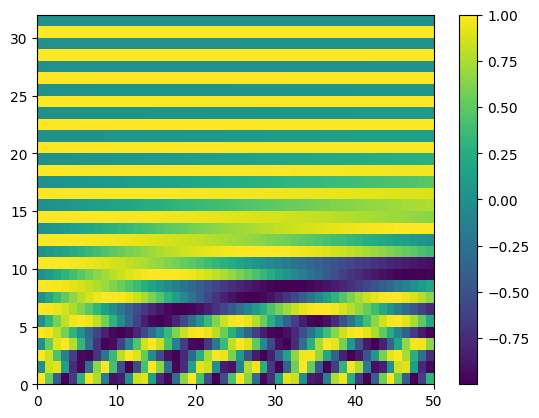

In [ ]:
# test encoding
import matplotlib.pyplot as plt
pos_encoding = positional_encoding(length=50, depth=32)

# Check the shape.
print(pos_encoding.shape)

# Plot the dimensions.
plt.pcolormesh(pos_encoding.T)
plt.colorbar()

### attention layer

In [ ]:
mha1 = nn.MultiheadAttention(embed_dim=64, num_heads=1, batch_first=True)
mha4 = nn.MultiheadAttention(embed_dim=64, num_heads=4, batch_first=True)

In [ ]:
print(mha1.in_proj_weight.shape) #= d * 3 x d
# K,Q,V dimension same as input embedding
# K,Q,V matrices combined in a single matrix
print(mha1.out_proj)  # d x d

torch.Size([192, 64])
NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)


In [ ]:
# all dimensions stay the same regardless of #heads
print(mha4.in_proj_weight.shape) #= d * 3 x d
print(mha4.out_proj)  # d x d

torch.Size([192, 64])
NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)


In [ ]:
# #heads must divide d
try:
    nn.MultiheadAttention(64, 3)
except Exception as e:
    print(e)

embed_dim must be divisible by num_heads


In [ ]:
e = nn.Embedding(max_features, 64)
x = torch.tensor(x_train_p[:100]) # GPU memory
x = e(x)
print(x.shape)
out, _ = mha1(x,x,x, need_weights=False)
print(out.shape)

torch.Size([100, 250, 64])
torch.Size([100, 250, 64])


## Linear layers with shared weights

In [ ]:
l1 = nn.Linear(10,5)

In [ ]:
l1(torch.ones(10))

tensor([ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017], grad_fn=<ViewBackward0>)

In [ ]:
#what if we pass multidimensional input?
l1(torch.ones(7,10))

tensor([[ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
        [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
        [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
        [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
        [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
        [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
        [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017]],
       grad_fn=<AddmmBackward0>)

In [ ]:
l1(torch.ones(2,7,10))

tensor([[[ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017]],

        [[ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017],
         [ 0.2306, -0.2462, -0.1067,  0.4616, -0.7017]]],
       grad_fn=<ViewBackward0>)

In [ ]:
# Linear layer is applied along the last dimension: weight sharing is automatic

### Network with one transformer block

In [ ]:
class Transf1(nn.Module):
  def __init__(self, nc=5):
    super().__init__()
    self.d = 128 # embedding dim
    self.e = nn.Embedding(max_features, self.d)
    pe = positional_encoding(length=250, depth=self.d)
    pe = pe.astype(np.float32)[np.newaxis,...]
    self.pe = torch.tensor(pe, requires_grad=False).to(device)
    self.mha = nn.MultiheadAttention(embed_dim=self.d, num_heads=4, batch_first=True)
    self.ln1 = nn.LayerNorm(self.d)
    self.l1 = nn.Linear(self.d, self.d)
    self.l2 = nn.Linear(self.d, self.d)
    self.ln2 = nn.LayerNorm(self.d)
    self.dropout = nn.Dropout(0.1)
    # final classifier
    self.fl = nn.Flatten()
    self.l3 = nn.Linear(self.d*250, 1)
  def forward(self, x):
    emb = self.e(x)
    e_p = emb + self.pe
    # 3 identical inputs for self-attention
    a, _ = self.mha(e_p, e_p, e_p, need_weights=False)
    x = a + e_p # residual connection
    x = self.ln1(x)
    r = x
    # feed-forward part
    x = self.l1(x)
    x = F.relu(x)
    x = self.l2(x)
    x = x + r # residual connection
    x = self.ln2(x)
    x = self.dropout(x)
    # end of transformer block, final classification
    x = self.fl(x)
    x = self.l3(x)
    return x

In [ ]:
m_transf1 = Transf1()
fit(m_transf1, epochs=10)

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.70284


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.73112


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.7728


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.79232


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.7848


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.7992


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.80792


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.80844


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.81268


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.8152


In [ ]:
#for module in m_transf1.children():
#    print(module, module.training)

Embedding(120000, 128) False
MultiheadAttention(
  (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
) False
LayerNorm((128,), eps=1e-05, elementwise_affine=True) False
Linear(in_features=128, out_features=128, bias=True) False
Linear(in_features=128, out_features=128, bias=True) False
LayerNorm((128,), eps=1e-05, elementwise_affine=True) False
Dropout(p=0.1, inplace=False) False
Flatten(start_dim=1, end_dim=-1) False
Linear(in_features=32000, out_features=1, bias=True) False


### Multiple transformer blocks - custom transformer block type

In [ ]:
class TransformerBlock(nn.Module):
    def __init__(self, num_heads, embed_dim, dropout_rate=0.1):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.dropout_rate = dropout_rate
        self.mha = nn.MultiheadAttention(num_heads=num_heads,
                                         embed_dim=embed_dim,
                                         batch_first=True)
        self.FF = nn.Sequential(
            nn.Linear(embed_dim, embed_dim),
            nn.ReLU(),
            nn.Linear(embed_dim, embed_dim),
        )
        self.ln1 = nn.LayerNorm(embed_dim)
        self.ln2 = nn.LayerNorm(embed_dim)
        self.dp = nn.Dropout(self.dropout_rate)

    def forward(self, inputs):
        a, _ = self.mha(query=inputs, value=inputs, key=inputs, need_weights=False)
        e2 = self.ln1(a + inputs)
        # feed-forward part
        e3 = self.FF(e2)
        e4 = self.ln2(e3 + e2)
        e4 = self.dp(e4)
        return e4

In [ ]:
class PositionBlock(nn.Module):
    def __init__(self, embed_dim, seq_length):
        super().__init__()
        pe = positional_encoding(length=seq_length, depth=embed_dim)
        pe = pe.astype(np.float32)[np.newaxis,...]
        self.pe = torch.tensor(pe, requires_grad=False).to(device)
    def forward(self, x):
        return x + self.pe

In [ ]:
d = 64
m_transf2 = nn.Sequential(
    nn.Embedding(max_features, d),
    PositionBlock(d, 250),
    TransformerBlock(4, d),
    nn.Flatten(),
    nn.LazyLinear(1)
)

In [ ]:
fit(m_transf2, epochs=10)

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.71872


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.75976


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.76764


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.78952


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.79384


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.79816


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.79268


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.80184


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.80468


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.80488


In [ ]:
d=32
m_transf3 = nn.Sequential(
    nn.Embedding(max_features, d),
    PositionBlock(d, 250),
    TransformerBlock(4, d),
    TransformerBlock(4, d),
    TransformerBlock(4, d),
    nn.Flatten(),
    nn.LazyLinear(1),
)

In [ ]:
fit(m_transf3, epochs=10)

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.6172


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.72424


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.7752


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.79604


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.80216


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.8154


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.80448


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.8188


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.81392


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.82148


# Visualizing attention layers

In [ ]:
class TransformerBlockVis(TransformerBlock):
    def __init__(self, num_heads, embed_dim, dropout_rate=0.1):
        super().__init__(num_heads, embed_dim, dropout_rate)
        self.w = None
    def forward(self, inputs):
        a, w = self.mha(query=inputs, value=inputs, key=inputs,
                        need_weights=True,
                        average_attn_weights=False) # weights for each head separately
        if not self.training:
            self.w = w.detach().clone()
        e2 = self.ln1(a + inputs)
        # feed-forward part
        e3 = self.FF(e2)
        e4 = self.ln2(e3 + e2)
        e4 = self.dp(e4)
        return e4

In [ ]:
d=32
m_transf_vis = nn.Sequential(
    nn.Embedding(max_features, d),
    PositionBlock(d, 250),
    TransformerBlockVis(4, d),
    TransformerBlockVis(4, d),
    nn.Flatten(),
    nn.LazyLinear(1),
)

In [ ]:
fit(m_transf_vis, epochs=20)

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.8206


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.81748


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.81324


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.81516


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.81864


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.81424


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.81656


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.81772


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.81292


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.81264


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 10 : 0.81356


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 11 : 0.81116


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 12 : 0.8182


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 13 : 0.81292


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 14 : 0.81148


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 15 : 0.81376


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 16 : 0.81296


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 17 : 0.81316


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 18 : 0.80812


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 19 : 0.81416


In [ ]:
# look at attention weights for first review
m_transf_vis(torch.tensor(x_train_p[:1]).to(device)).shape

torch.Size([1, 1])

In [ ]:
mha1 = m_transf_vis[2]

In [ ]:
mha1.w.shape  # batch x heads x len x len

torch.Size([1, 4, 250, 250])

In [ ]:
w1 = mha1.w.cpu() # for plotting

In [ ]:
w1[0,0,:,:].sum(axis=1)  # => i-th row: how well each word matches query_i
# i.e. how much each word contributes to the i-th output token
# should sum to 1

tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000, 1.0000,
        1.0000, 1.0000, 1.0000, 1.0000, 

In [ ]:
import matplotlib.pyplot as plt

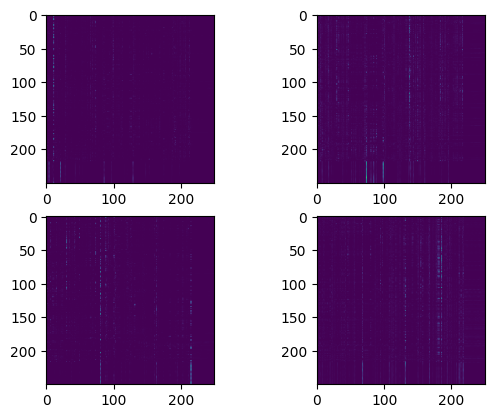

In [ ]:
# all heads
_, axs = plt.subplots(2,2)
axs[0,0].imshow(w1[0,0,:,:])
axs[0,1].imshow(w1[0,1,:,:])
axs[1,0].imshow(w1[0,2,:,:])
axs[1,1].imshow(w1[0,3,:,:])

In [ ]:
# pick shortest review to get better view
np.argmin(list(len(x) for x in x_train))

6719

In [ ]:
txt = [iw[x] for x in x_train_p[6719][:11]]
txt

['<START>',
 'i',
 "wouldn't",
 'rent',
 'this',
 'one',
 'even',
 'on',
 'dollar',
 'rental',
 'night']

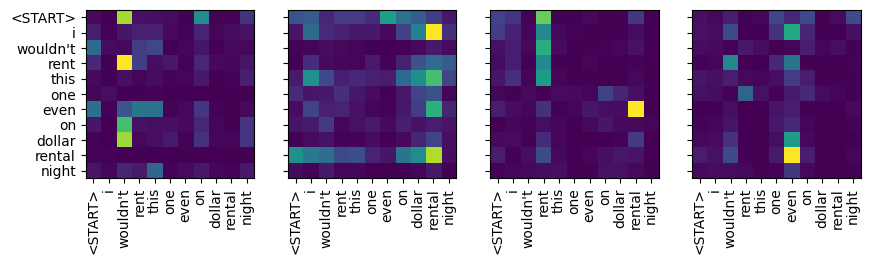

In [ ]:
_ = m_transf_vis(torch.tensor(x_train_p[6719:6720]).to(device))
w1 = m_transf_vis[2].w.cpu()
_, axs = plt.subplots(ncols=4, sharey=True, figsize=(10,10))
for head in range(4):
  axs[head].imshow(w1[0,head,:11,:11])
  _ = axs[head].set_xticks(np.arange(len(txt)), labels=txt, rotation=90)
  _ = axs[head].set_yticks(np.arange(len(txt)), labels=txt)

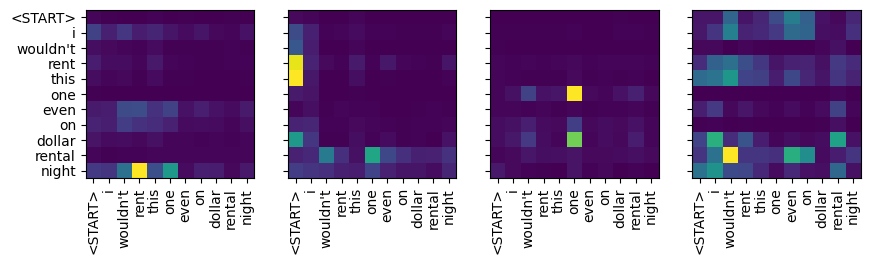

In [ ]:
# second transformer block
w2 = m_transf_vis[3].w.cpu()
_, axs = plt.subplots(ncols=4, sharey=True, figsize=(10,10))
for head in range(4):
  axs[head].imshow(w2[0,head,:11,:11])
  _ = axs[head].set_xticks(np.arange(len(txt)), labels=txt, rotation=90)
  _ = axs[head].set_yticks(np.arange(len(txt)), labels=txt)

# another type of visualization

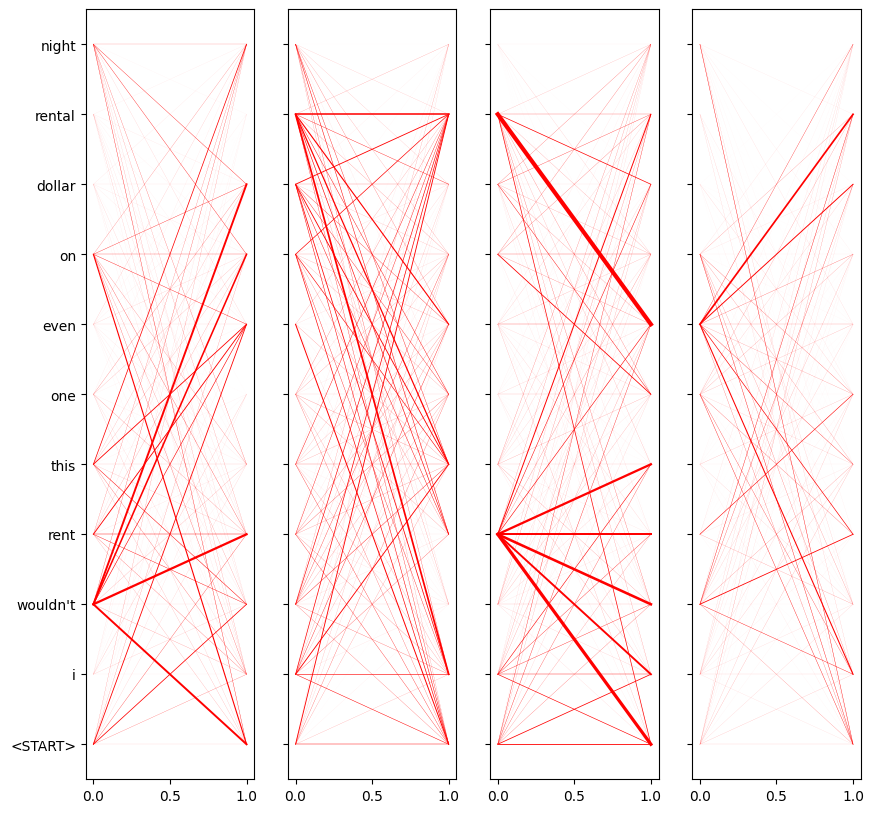

In [ ]:
_ = m_transf_vis(torch.tensor(x_train_p[6719:6720]).to(device))
w1 = m_transf_vis[2].w.cpu()
_, axs = plt.subplots(ncols=4, sharey=True, figsize=(10,10))
for head in range(4):
  #_ = axs[head].set_xticks(np.arange(len(txt)), labels=txt, rotation=90)
  _ = axs[head].set_yticks(np.arange(len(txt)), labels=txt)
  mw = w1[0,head,:,:].abs().max()
  for i, tok1 in enumerate(txt):
    for j, tok2 in enumerate(txt):
      w = w1[0,head,i, j]
      axs[head].plot([0,1], [j,i], linewidth=w/mw*3, color="r")

# Masking

In [ ]:
# padding symbols are treated as ordinary words: not necessarily the best choice
# MultiheadAttention allows for various masks (nested tensor can also be used)
# simplest: key mask

In [ ]:
class TransformerBlockVisMask(TransformerBlockVis):
    def forward(self, inputs, mask):
        a, w = self.mha(query=inputs, value=inputs, key=inputs,
                        key_padding_mask=mask,
                        need_weights=True,
                        average_attn_weights=False) # weights for each head separately
        if not self.training:
            self.w = w.detach().clone()
        e2 = self.ln1(a + inputs)
        # feed-forward part
        e3 = self.FF(e2)
        e4 = self.ln2(e3 + e2)
        e4 = self.dp(e4)
        return e4

In [ ]:
class Transf_mask(nn.Module):
    def __init__(self, d=32):
        super().__init__()
        self.d = d
        self.emb = nn.Embedding(max_features, d)
        self.pos = PositionBlock(d, 250)
        self.t1 = TransformerBlockVisMask(4, d)
        self.t2 = TransformerBlockVisMask(4, d)
        self.fl = nn.Flatten()
        self.l1 = nn.LazyLinear(1)
    def forward(self, x):
        mask = (x == 0)
        emb = self.emb(x)
        pos = self.pos(emb)
        t1 = self.t1(pos, mask)
        t2 = self.t2(t1, mask)
        x = self.fl(t2)
        x = self.l1(x)
        return x

In [ ]:
m_transf_vis_mask = Transf_mask()
fit(m_transf_vis_mask, epochs=20)

  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 0 : 0.67868


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 1 : 0.7442


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 2 : 0.7794


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 3 : 0.79276


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 4 : 0.80244


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 5 : 0.78904


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 6 : 0.80928


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 7 : 0.80608


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 8 : 0.81852


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 9 : 0.80948


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 10 : 0.80772


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 11 : 0.81104


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 12 : 0.8084


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 13 : 0.81072


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 14 : 0.81308


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 15 : 0.8116


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 16 : 0.81128


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 17 : 0.81096


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 18 : 0.81468


  0%|          | 0/196 [00:00<?, ?it/s]

  0%|          | 0/196 [00:00<?, ?it/s]

Accuracy at epoch 19 : 0.8106


In [ ]:
m_transf_vis_mask(torch.tensor(x_train_p[:1]).to(device))

tensor([[16.2946]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
w1 = m_transf_vis_mask.t1.w.cpu()
w1[0,0,0,:] # keys afer sequence end not considered in matching

tensor([4.2007e-04, 5.6253e-04, 2.4202e-04, 1.1172e-03, 6.7286e-05, 1.0749e-02,
        2.2120e-05, 6.6188e-05, 8.0261e-05, 8.4212e-03, 4.2420e-03, 8.1699e-05,
        1.7292e-04, 1.0960e-04, 5.7157e-04, 2.2067e-04, 2.5665e-02, 1.4194e-04,
        1.1576e-03, 1.3017e-04, 1.0048e-04, 6.9602e-05, 2.4760e-05, 1.1191e-03,
        6.7921e-04, 3.6725e-04, 7.2991e-04, 6.0442e-04, 3.7994e-04, 6.0470e-02,
        8.5066e-04, 1.0860e-03, 1.8517e-04, 4.8310e-04, 1.2735e-02, 1.2776e-03,
        1.5016e-04, 1.2461e-01, 8.3250e-05, 3.3130e-04, 2.0399e-04, 5.8740e-04,
        6.5082e-03, 8.1062e-04, 7.9934e-05, 1.1550e-04, 8.4473e-04, 3.7612e-04,
        2.1456e-04, 4.2103e-04, 2.8247e-04, 5.4922e-04, 4.0846e-04, 6.0245e-04,
        3.2377e-04, 9.7712e-04, 1.1153e-04, 4.9212e-04, 1.0969e-03, 3.7158e-04,
        8.3254e-04, 2.1185e-03, 7.9886e-05, 4.3251e-05, 3.3377e-04, 2.1126e-04,
        2.5907e-02, 2.5744e-02, 5.7139e-03, 6.1522e-04, 6.6077e-05, 2.5972e-02,
        2.5319e-04, 1.6887e-04, 5.4496e-

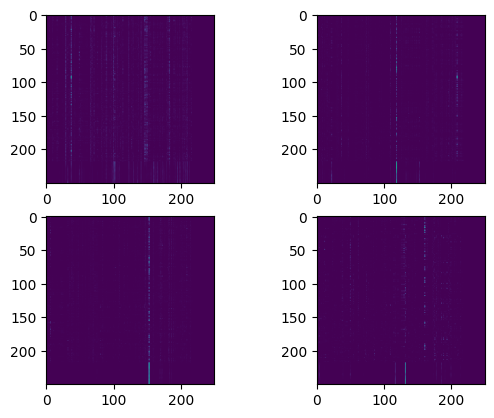

In [ ]:
_, axs = plt.subplots(2,2)
axs[0,0].imshow(w1[0,0,:,:])
axs[0,1].imshow(w1[0,1,:,:])
axs[1,0].imshow(w1[0,2,:,:])
axs[1,1].imshow(w1[0,3,:,:])

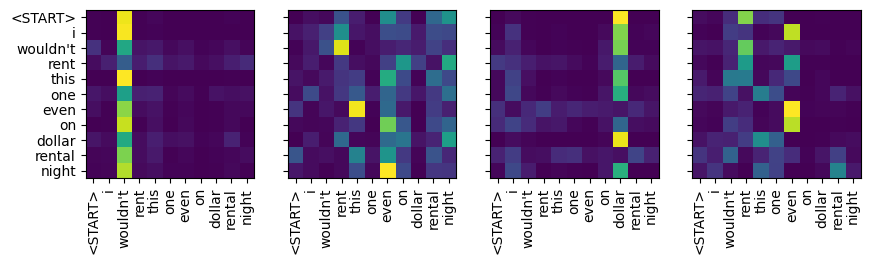

In [ ]:
_ = m_transf_vis_mask(torch.tensor(x_train_p[6719:6720]).to(device))
w1 = m_transf_vis_mask.t1.w.cpu()
_, axs = plt.subplots(ncols=4, sharey=True, figsize=(10,10))
for head in range(4):
  axs[head].imshow(w1[0,head,:11,:11])
  _ = axs[head].set_xticks(np.arange(len(txt)), labels=txt, rotation=90)
  _ = axs[head].set_yticks(np.arange(len(txt)), labels=txt)

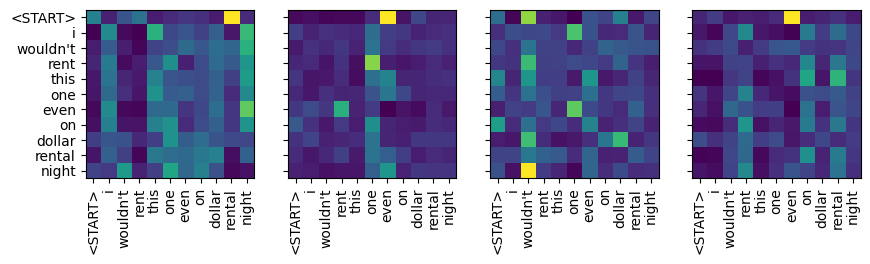

In [ ]:
_ = m_transf_vis_mask(torch.tensor(x_train_p[6719:6720]).to(device))
w2 = m_transf_vis_mask.t2.w.cpu()
_, axs = plt.subplots(ncols=4, sharey=True, figsize=(10,10))
for head in range(4):
  axs[head].imshow(w2[0,head,:11,:11])
  _ = axs[head].set_xticks(np.arange(len(txt)), labels=txt, rotation=90)
  _ = axs[head].set_yticks(np.arange(len(txt)), labels=txt)